<a href="https://colab.research.google.com/github/cpduffy4/Data201/blob/main/Data201Project2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Import packages

In [1012]:
import pandas as pd
import numpy as np
import scipy
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split,KFold
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV
from imblearn.over_sampling import SMOTE
from scipy.stats import skew,kurtosis,boxcox,boxcox_normmax
from sklearn import metrics
from sklearn.metrics import accuracy_score,precision_score,roc_auc_score,f1_score,recall_score,auc,make_scorer
from sklearn.metrics import confusion_matrix,classification_report
import matplotlib.pyplot as plt
%matplotlib inline
import statsmodels.api as sm
import seaborn as sns

Read in data, Data is sourced from the UCI machine learning repository. The Data is from direct marketing campaigns from a Portuguese banking institution. The primary purpose of this dataset, is to determine if the client will subscribe to a term deposit, which is referred to in the dataset as y

(link to source - https://archive.ics.uci.edu/ml/datasets/bank+marketing)

Citation: [Moro et al., 2014] S. Moro, P. Cortez and P. Rita. A Data-Driven Approach to Predict the Success of Bank Telemarketing. Decision Support Systems, Elsevier, 62:22-31, June 2014

In [1013]:
df = pd.read_csv('bank-additional-full.csv',sep=';')

In [1014]:
df

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,261,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,149,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,226,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,151,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,307,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41183,73,retired,married,professional.course,no,yes,no,cellular,nov,fri,334,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,yes
41184,46,blue-collar,married,professional.course,no,no,no,cellular,nov,fri,383,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no
41185,56,retired,married,university.degree,no,yes,no,cellular,nov,fri,189,2,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no
41186,44,technician,married,professional.course,no,no,no,cellular,nov,fri,442,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,yes


In [1015]:
df[df.duplicated()]

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
1266,39,blue-collar,married,basic.6y,no,no,no,telephone,may,thu,124,1,999,0,nonexistent,1.1,93.994,-36.4,4.855,5191.0,no
12261,36,retired,married,unknown,no,no,no,telephone,jul,thu,88,1,999,0,nonexistent,1.4,93.918,-42.7,4.966,5228.1,no
14234,27,technician,single,professional.course,no,no,no,cellular,jul,mon,331,2,999,0,nonexistent,1.4,93.918,-42.7,4.962,5228.1,no
16956,47,technician,divorced,high.school,no,yes,no,cellular,jul,thu,43,3,999,0,nonexistent,1.4,93.918,-42.7,4.962,5228.1,no
18465,32,technician,single,professional.course,no,yes,no,cellular,jul,thu,128,1,999,0,nonexistent,1.4,93.918,-42.7,4.968,5228.1,no
20216,55,services,married,high.school,unknown,no,no,cellular,aug,mon,33,1,999,0,nonexistent,1.4,93.444,-36.1,4.965,5228.1,no
20534,41,technician,married,professional.course,no,yes,no,cellular,aug,tue,127,1,999,0,nonexistent,1.4,93.444,-36.1,4.966,5228.1,no
25217,39,admin.,married,university.degree,no,no,no,cellular,nov,tue,123,2,999,0,nonexistent,-0.1,93.200,-42.0,4.153,5195.8,no
28477,24,services,single,high.school,no,yes,no,cellular,apr,tue,114,1,999,0,nonexistent,-1.8,93.075,-47.1,1.423,5099.1,no
32516,35,admin.,married,university.degree,no,yes,no,cellular,may,fri,348,4,999,0,nonexistent,-1.8,92.893,-46.2,1.313,5099.1,no


In [1016]:
df.drop_duplicates(inplace=True)

In [1017]:
df.reset_index(inplace=True)

In [1018]:
df.drop('index',axis=1,inplace=True)

In [1019]:
df

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,261,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,149,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,226,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,151,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,307,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41171,73,retired,married,professional.course,no,yes,no,cellular,nov,fri,334,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,yes
41172,46,blue-collar,married,professional.course,no,no,no,cellular,nov,fri,383,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no
41173,56,retired,married,university.degree,no,yes,no,cellular,nov,fri,189,2,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no
41174,44,technician,married,professional.course,no,no,no,cellular,nov,fri,442,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,yes


In [1020]:
df.isnull().sum()

age               0
job               0
marital           0
education         0
default           0
housing           0
loan              0
contact           0
month             0
day_of_week       0
duration          0
campaign          0
pdays             0
previous          0
poutcome          0
emp.var.rate      0
cons.price.idx    0
cons.conf.idx     0
euribor3m         0
nr.employed       0
y                 0
dtype: int64

While there are no null values, there are a number of unknown values in this dataset.

In [1021]:
df = df.replace('unknown', np.nan)

In [1022]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41176 entries, 0 to 41175
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41176 non-null  int64  
 1   job             40846 non-null  object 
 2   marital         41096 non-null  object 
 3   education       39446 non-null  object 
 4   default         32580 non-null  object 
 5   housing         40186 non-null  object 
 6   loan            40186 non-null  object 
 7   contact         41176 non-null  object 
 8   month           41176 non-null  object 
 9   day_of_week     41176 non-null  object 
 10  duration        41176 non-null  int64  
 11  campaign        41176 non-null  int64  
 12  pdays           41176 non-null  int64  
 13  previous        41176 non-null  int64  
 14  poutcome        41176 non-null  object 
 15  emp.var.rate    41176 non-null  float64
 16  cons.price.idx  41176 non-null  float64
 17  cons.conf.idx   41176 non-null 

In [1023]:
df.dropna(inplace=True)

In [1024]:
df.describe()

,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
count,30478.000000,30478.000000,30478.000000,30478.000000,30478.000000,30478.000000,30478.000000,30478.000000,30478.000000,30478.000000
mean,39.029694,259.513124,2.521721,956.318295,0.194337,-0.071425,93.523376,-40.602579,3.459976,5160.813967
std,10.332746,261.746393,2.720495,201.404843,0.522862,1.610306,0.585366,4.788790,1.777215,75.158267
min,17.000000,0.000000,1.000000,0.000000,0.000000,-3.400000,92.201000,-50.800000,0.634000,4963.600000
25%,31.000000,103.000000,1.000000,999.000000,0.000000,-1.800000,93.075000,-42.700000,1.313000,5099.100000
50%,37.000000,181.000000,2.000000,999.000000,0.000000,1.100000,93.444000,-41.800000,4.856000,5191.000000
75%,45.000000,321.000000,3.000000,999.000000,0.000000,1.400000,93.994000,-36.400000,4.961000,5228.100000
max,95.000000,4918.000000,43.000000,999.000000,7.000000,1.400000,94.767000,-26.900000,5.045000,5228.100000


In [1025]:
df.reset_index(inplace=True)

In [1026]:
df.drop('index',axis=1,inplace=True)

In [1027]:
df.isnull().sum()

age               0
job               0
marital           0
education         0
default           0
housing           0
loan              0
contact           0
month             0
day_of_week       0
duration          0
campaign          0
pdays             0
previous          0
poutcome          0
emp.var.rate      0
cons.price.idx    0
cons.conf.idx     0
euribor3m         0
nr.employed       0
y                 0
dtype: int64

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'Distribution of age')

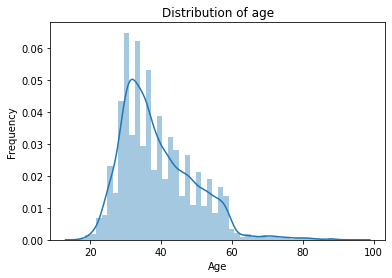

In [1028]:
sns.distplot(df.age)
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.title('Distribution of age')

Graph is slightly skewed, should be normal distribution

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


Text(0.5, 1.0, 'Outliers Check')

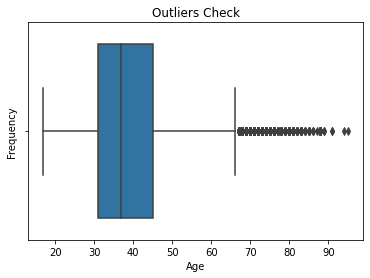

In [1029]:
sns.boxplot(df.age)
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.title('Outliers Check')

has outliers, can do boxcox transformation

In [1030]:
print('Skewness',scipy.stats.skew(df.age))

Skewness 0.9799705077797797


In [1031]:
df.age = boxcox(df.age,boxcox_normmax(df.age))

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'Adjusted Age Distribution')

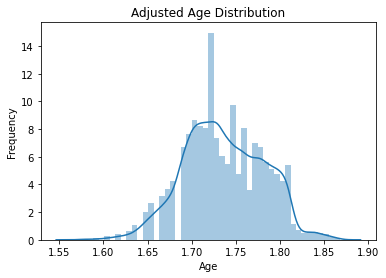

In [1032]:
sns.distplot(df.age)
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.title('Adjusted Age Distribution')

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


Text(0.5, 1.0, 'Second Outlier Check')

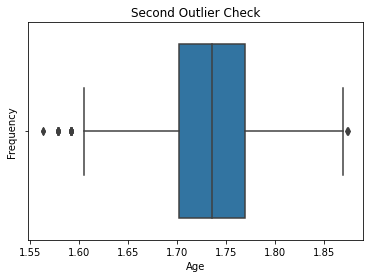

In [1033]:
sns.boxplot(df.age)
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.title('Second Outlier Check')

In [1034]:
print('Skewness after Boxcox',scipy.stats.skew(df.age))

Skewness after Boxcox -0.0011166822532895344


Very small skewness

Convert Categorical variables into numbers

Was Campaign Successful?

In [1035]:
df.y.unique()

array(['no', 'yes'], dtype=object)

In [1036]:
df.y = df.y.replace(['no', 'yes'],[0,1])

Job:

In [1037]:
df.job.value_counts()

admin.           8734
blue-collar      5674
technician       5469
services         2856
management       2311
retired          1215
self-employed    1092
entrepreneur     1089
unemployed        738
housemaid         690
student           610
Name: job, dtype: int64

In [1038]:
df.job.unique()

array(['housemaid', 'services', 'admin.', 'technician', 'blue-collar',
       'unemployed', 'retired', 'entrepreneur', 'management', 'student',
       'self-employed'], dtype=object)

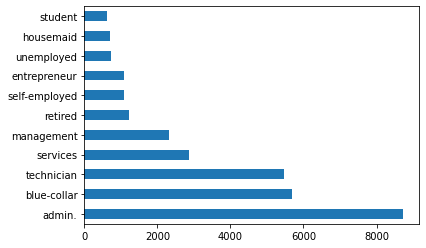

In [1039]:
df['job'].value_counts()[:20].plot(kind='barh')

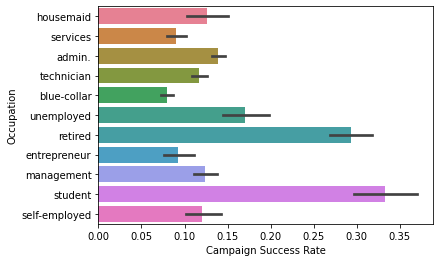

In [1040]:
sns.barplot(x="y", y="job", data=df, palette="husl")
plt.xlabel('Campaign Success Rate')
plt.ylabel('Occupation')
plt.show()

Despite Student being the second lowest group reached out to, the campaign was most successful at targeting them. The least successful was blue-collar workers, which despite being the second most commonly reached out to group has the lowest success rate of any job tested in this campaign.

In [1041]:
l_enc = LabelEncoder()

In [1042]:
df.job = l_enc.fit_transform(df.job)


In [1043]:
df.job.unique()

array([ 3,  7,  0,  9,  1, 10,  5,  2,  4,  8,  6])

Marital Status:

In [1044]:
print(sorted(df.marital.unique()))

['divorced', 'married', 'single']


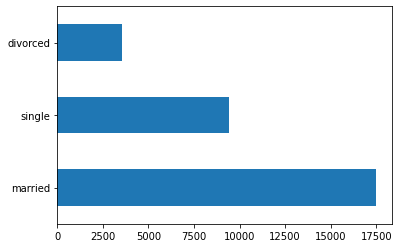

In [1045]:
df['marital'].value_counts()[:20].plot(kind='barh')

In [1046]:
df.marital.value_counts()

married     17487
single       9439
divorced     3552
Name: marital, dtype: int64

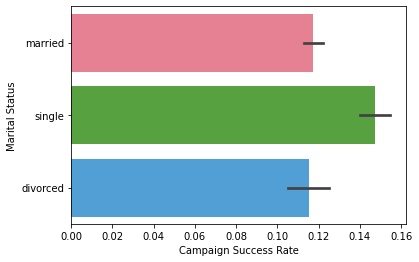

In [1047]:
sns.barplot(x="y", y="marital", data=df, palette="husl")
plt.xlabel('Campaign Success Rate')
plt.ylabel('Marital Status')
plt.show()

Single people were the most likely to have been affected by the campaign.

In [1048]:
df.marital = df.marital.replace(['divorced', 'married', 'single'],[0,1,2])

Has Credit In Default?

In [1049]:
print(sorted(df.default.unique()))

['no', 'yes']


In [1050]:
df.default.value_counts()

no     30475
yes        3
Name: default, dtype: int64

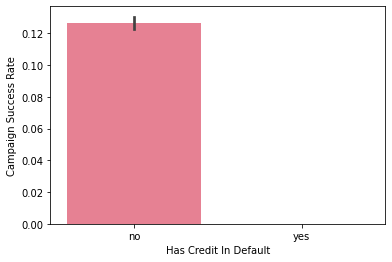

In [1051]:
sns.barplot(x="default", y="y", data=df, palette="husl")
plt.xlabel('Has Credit In Default')
plt.ylabel('Campaign Success Rate')
plt.show()

This shows that only three people contacted had credit in default, and that none of them were marketed to successfully. This section will be dropped because little can be gained from it.

In [1052]:
df.default = df.default.replace(['no', 'yes'],[0,1])

In [945]:
#df = df.drop(['default'],axis=1)

Level of Education:

In [1053]:
print(sorted(df.education.unique()))

['basic.4y', 'basic.6y', 'basic.9y', 'high.school', 'illiterate', 'professional.course', 'university.degree']


In [1054]:
df.education.value_counts()

university.degree      10408
high.school             7697
professional.course     4318
basic.9y                4276
basic.4y                2380
basic.6y                1388
illiterate                11
Name: education, dtype: int64

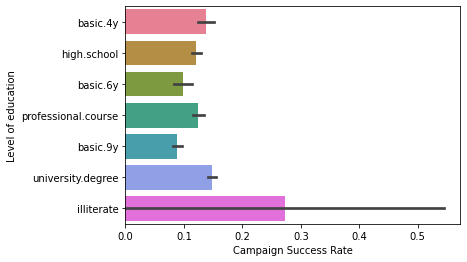

In [1055]:
sns.barplot(x="y", y="education", data=df, palette="husl")
plt.xlabel('Campaign Success Rate')
plt.ylabel('Level of education')
plt.show()

In [1056]:
df.education = df.education.replace(['basic.4y', 'basic.6y', 'basic.9y', 'high.school', 'illiterate', 'professional.course', 'university.degree'],[0,1,2,3,4,5,6])

In [1057]:
df.education.unique()

array([0, 3, 1, 5, 2, 6, 4])

Has Housing Loan?

In [1058]:
print(sorted(df.housing.unique()))

['no', 'yes']


In [1059]:
df.housing.value_counts()

yes    16516
no     13962
Name: housing, dtype: int64

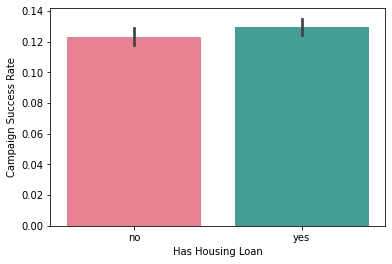

In [1060]:
sns.barplot(x="housing", y="y", data=df, palette="husl")
plt.xlabel('Has Housing Loan')
plt.ylabel('Campaign Success Rate')
plt.show()

The success rate was fairly similar between people with and without a housing loan

In [1061]:
df.housing = df.housing.replace(['no', 'yes'],[0,1])

Has Personal Loan?

In [1062]:
print(sorted(df.loan.unique()))

['no', 'yes']


In [1065]:
df.loan.value_counts()

no     25710
yes     4768
Name: loan, dtype: int64

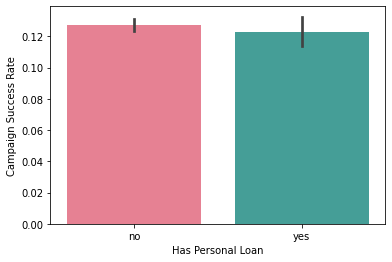

In [1066]:
sns.barplot(x="loan", y="y", data=df, palette="husl")
plt.xlabel('Has Personal Loan')
plt.ylabel('Campaign Success Rate')
plt.show()

The rate did not change substantially between people with and without a personal loan

In [1067]:
df.loan = df.loan.replace(['no', 'yes'],[0,1])

Method of Contact:

In [1068]:
print(sorted(df.contact.unique()))

['cellular', 'telephone']


In [1069]:
df.contact.value_counts()

cellular     20435
telephone    10043
Name: contact, dtype: int64

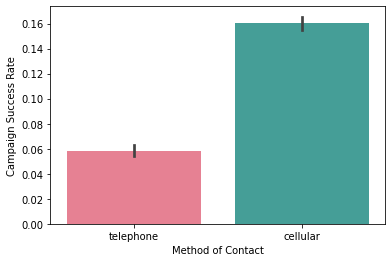

In [1070]:
sns.barplot(x="contact", y="y", data=df, palette="husl")
plt.xlabel('Method of Contact')
plt.ylabel('Campaign Success Rate')
plt.show()

Campaign was far more successful when calling cellphones opposed to telephones

In [1071]:
df.contact = df.contact.replace(['cellular', 'telephone'],[0,1])

Month of contact:

In [1072]:
print(sorted(df.month.unique()))

['apr', 'aug', 'dec', 'jul', 'jun', 'mar', 'may', 'nov', 'oct', 'sep']


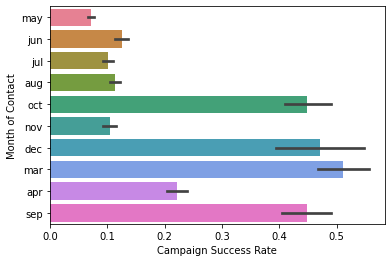

In [1073]:
sns.barplot(x="y", y="month", data=df, palette="husl")
plt.xlabel('Campaign Success Rate')
plt.ylabel('Month of Contact')
plt.show()

Summer was not a good time for the success rate, the most successful month was March followed by December. 

In [1074]:
df.month = df.month.replace(['apr', 'aug', 'dec', 'jul', 'jun', 'mar', 'may', 'nov', 'oct', 'sep'],range(0,10))

In [1075]:
print(df.month.unique())

[6 4 3 1 8 7 2 5 0 9]


Day of the the week contact made:

In [1076]:
print(sorted(df.day_of_week.unique()))

['fri', 'mon', 'thu', 'tue', 'wed']


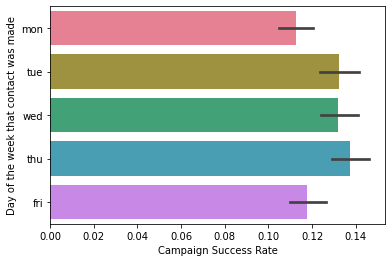

In [1077]:
sns.barplot(x="y", y="day_of_week", data=df, palette="husl")
plt.xlabel('Campaign Success Rate')
plt.ylabel('Day of the week that contact was made')
plt.show()

Not incredible variance, though the middle of the week was slightly more successful.

In [1078]:
df.day_of_week = df.day_of_week.replace(['fri', 'mon', 'thu', 'tue', 'wed'],[0,1,2,3,4])

In [1079]:
print(df.day_of_week.unique())

[1 3 4 2 0]


Was the previous campaign successful against this client?

In [1080]:
print(sorted(df.poutcome.unique()))

['failure', 'nonexistent', 'success']


In [1081]:
df.poutcome.value_counts()

nonexistent    25826
failure         3461
success         1191
Name: poutcome, dtype: int64

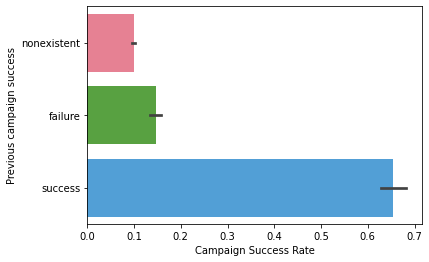

In [1082]:
sns.barplot(x="y", y="poutcome", data=df, palette="husl")
plt.xlabel('Campaign Success Rate')
plt.ylabel('Previous campaign success')
plt.show()

Clients who had been convinced prior were far more likely to be convinced this time opposed to people who had either never been contacted before, or had failed to be convinced before.

In [1083]:
df.poutcome = df.poutcome.replace(['failure', 'nonexistent', 'success'],[0,1,2])

Was this campaign successful?

In [1084]:
df.sample(5)

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
6117,1.811387,3,1,0,0,0,1,1,4,1,63,1,999,0,1,1.4,94.465,-41.8,4.961,5228.1,0
21695,1.813838,0,1,6,0,1,0,0,6,1,226,2,11,1,2,-1.8,92.893,-46.2,1.354,5099.1,1
27643,1.776253,0,1,6,0,0,0,0,9,0,639,3,999,1,0,-3.4,92.379,-29.8,0.803,5017.5,0
130,1.729962,9,2,5,0,0,0,1,6,1,124,1,999,0,1,1.1,93.994,-36.4,4.857,5191.0,0
16118,1.707586,0,1,6,0,1,0,0,1,0,122,2,999,0,1,1.4,93.444,-36.1,4.963,5228.1,0


All numerics, lets move on

Correlation Graph

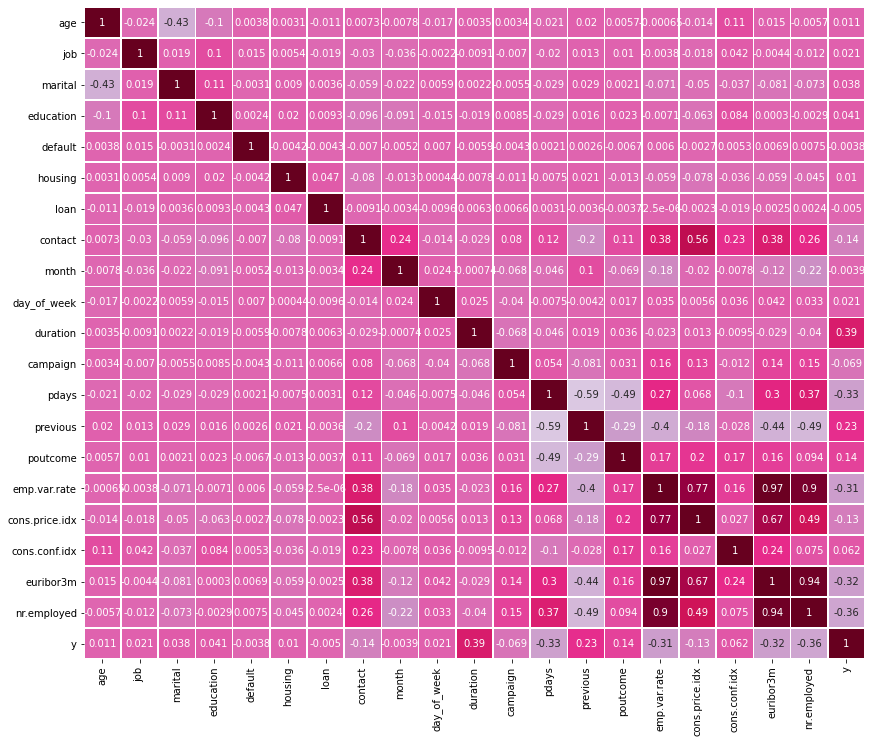

In [1085]:
plt.figure(figsize=(14,12))
sns.heatmap(df.corr(),
            annot=True,
            linewidth=.5,
            center = 0,
            cbar=False,
            cmap='PuRd')
plt.show()

Drop columns with high correlation not related to y

In [1086]:
df = df.drop(['contact','previous', 'emp.var.rate', 'cons.price.idx',
        'euribor3m', 'nr.employed'],axis=1)

In [1087]:
df

,age,job,marital,education,default,housing,loan,month,day_of_week,duration,campaign,pdays,poutcome,cons.conf.idx,y
0,1.803654,3,1,0,0,0,0,6,1,261,1,999,1,-36.4,0
1,1.734991,7,1,3,0,1,0,6,1,226,1,999,1,-36.4,0
2,1.748952,0,1,1,0,0,0,6,1,151,1,999,1,-36.4,0
3,1.803654,7,1,3,0,0,1,6,1,307,1,999,1,-36.4,0
4,1.811387,0,1,5,0,0,0,6,1,139,1,999,1,-36.4,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30473,1.841042,5,1,5,0,1,0,7,0,334,1,999,1,-50.8,1
30474,1.772731,1,1,5,0,0,0,7,0,383,1,999,1,-50.8,0
30475,1.803654,5,1,6,0,1,0,7,0,189,2,999,1,-50.8,0
30476,1.765337,9,1,5,0,0,0,7,0,442,1,999,1,-50.8,1


Define X and Y

In [1088]:
X = df.loc[:,df.columns != 'y']
Y = df.loc[:,df.columns == 'y']

In [1089]:
X

,age,job,marital,education,default,housing,loan,month,day_of_week,duration,campaign,pdays,poutcome,cons.conf.idx
0,1.803654,3,1,0,0,0,0,6,1,261,1,999,1,-36.4
1,1.734991,7,1,3,0,1,0,6,1,226,1,999,1,-36.4
2,1.748952,0,1,1,0,0,0,6,1,151,1,999,1,-36.4
3,1.803654,7,1,3,0,0,1,6,1,307,1,999,1,-36.4
4,1.811387,0,1,5,0,0,0,6,1,139,1,999,1,-36.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30473,1.841042,5,1,5,0,1,0,7,0,334,1,999,1,-50.8
30474,1.772731,1,1,5,0,0,0,7,0,383,1,999,1,-50.8
30475,1.803654,5,1,6,0,1,0,7,0,189,2,999,1,-50.8
30476,1.765337,9,1,5,0,0,0,7,0,442,1,999,1,-50.8


In [1090]:
Y

,y
0,0
1,0
2,0
3,0
4,0
...,...
30473,1
30474,0
30475,0
30476,1


Oridinary Least Squares to find significance

In [1091]:
ols = sm.OLS(Y,X).fit()

print(ols.summary2())

                        Results: Ordinary least squares
Model:                  OLS              Adj. R-squared (uncentered): 0.350     
Dependent Variable:     y                AIC:                         10399.8554
Date:                   2021-04-29 20:50 BIC:                         10516.4021
No. Observations:       30478            Log-Likelihood:              -5185.9   
Df Model:               14               F-statistic:                 1171.     
Df Residuals:           30464            Prob (F-statistic):          0.00      
R-squared (uncentered): 0.350            Scale:                       0.082322  
-----------------------------------------------------------------------------------
                     Coef.     Std.Err.       t        P>|t|      [0.025     0.975]
-----------------------------------------------------------------------------------
age                  0.3184      0.0108     29.4860    0.0000     0.2972     0.3396
job                  0.0012      0.0005  

p needs to be < .05 for significance, dropping non signifigant columns

In [1092]:
df = df.drop(['default', 'loan', 'day_of_week'],axis =1)

In [1093]:
df

,age,job,marital,education,housing,month,duration,campaign,pdays,poutcome,cons.conf.idx,y
0,1.803654,3,1,0,0,6,261,1,999,1,-36.4,0
1,1.734991,7,1,3,1,6,226,1,999,1,-36.4,0
2,1.748952,0,1,1,0,6,151,1,999,1,-36.4,0
3,1.803654,7,1,3,0,6,307,1,999,1,-36.4,0
4,1.811387,0,1,5,0,6,139,1,999,1,-36.4,0
...,...,...,...,...,...,...,...,...,...,...,...,...
30473,1.841042,5,1,5,1,7,334,1,999,1,-50.8,1
30474,1.772731,1,1,5,0,7,383,1,999,1,-50.8,0
30475,1.803654,5,1,6,1,7,189,2,999,1,-50.8,0
30476,1.765337,9,1,5,0,7,442,1,999,1,-50.8,1


In [1094]:
X = df.loc[:,df.columns != 'y']
Y = df.loc[:,df.columns == 'y']

In [1095]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.30, random_state=0)
print(X_train.shape)
print(Y_train.shape)
print(X_test.shape)
print(Y_test.shape)

(21334, 11)
(21334, 1)
(9144, 11)
(9144, 1)


In [1096]:
Y_train.value_counts()

y
0    18628
1     2706
dtype: int64

Data is very unbalanced, which leads to high innaccuracy for the minority class, fixing using SMOTE

In [1097]:
os = SMOTE(random_state = 2)

os_X, os_Y = os.fit_resample(X_train,Y_train)
os_Y=pd.Series(os_Y)


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


In [1098]:
os_Y.value_counts()

1    18628
0    18628
dtype: int64

Decision Tree: 

In [1099]:
decTreeGini = DecisionTreeClassifier()


decTreeGini.fit(os_X,os_Y)

# Predict the model
decTreeGini_predicted_y = decTreeGini.predict(X_test)

Confusion Matrix:

In [1100]:
decTreeGini_confusion = confusion_matrix(Y_test,decTreeGini_predicted_y)
print(decTreeGini_confusion)

Accuracy_Score = round(accuracy_score(Y_test,decTreeGini_predicted_y)*100,2)
print('DT_Gini_Accuracy_Score is ', Accuracy_Score)

print(classification_report(Y_test,decTreeGini_predicted_y))

[[7361  631]
 [ 533  619]]
DT_Gini_Accuracy_Score is  87.27
              precision    recall  f1-score   support

           0       0.93      0.92      0.93      7992
           1       0.50      0.54      0.52      1152

    accuracy                           0.87      9144
   macro avg       0.71      0.73      0.72      9144
weighted avg       0.88      0.87      0.87      9144



In [1101]:
def train_using_gini(X_train, X_test, Y_train):
    clf_gini = DecisionTreeClassifier(criterion = "gini",
            random_state = 100, min_samples_leaf=5)
    clf_gini.fit(X_train, Y_train)
    return clf_gini   
def train_using_entropy(X_train, X_test, Y_train):
    clf_entropy = DecisionTreeClassifier(
            criterion = "entropy", random_state = 100,
             min_samples_leaf = 5)
    clf_entropy.fit(X_train, Y_train)
    return clf_entropy
def prediction(X_test, clf_object):
  
    y_pred = clf_object.predict(X_test)
    print("Predicted values:")
    print(y_pred)
    return y_pred
def cal_accuracy(Y_test, y_pred):
      
    print("Confusion Matrix: ",
        confusion_matrix(Y_test, y_pred))
      
    print ("Accuracy : ",
    accuracy_score(Y_test,y_pred)*100)
      
    print("Report : ",
    classification_report(Y_test, y_pred))

In [1102]:
clf_gini = train_using_gini(os_X, X_test, os_Y)
clf_entropy = train_using_entropy(os_X, X_test, os_Y)

print("Results Using Gini Index:")     
# Prediction using gini
y_pred_gini = prediction(X_test, clf_gini)
cal_accuracy(Y_test, y_pred_gini)      


print("Results Using Entropy:")
# Prediction using entropy
y_pred_entropy = prediction(X_test, clf_entropy)
cal_accuracy(Y_test, y_pred_entropy)


Results Using Gini Index:
Predicted values:
[0 0 0 ... 0 1 0]
Confusion Matrix:  [[7381  611]
 [ 524  628]]
Accuracy :  87.58748906386703
Report :                precision    recall  f1-score   support

           0       0.93      0.92      0.93      7992
           1       0.51      0.55      0.53      1152

    accuracy                           0.88      9144
   macro avg       0.72      0.73      0.73      9144
weighted avg       0.88      0.88      0.88      9144

Results Using Entropy:
Predicted values:
[0 0 0 ... 1 1 1]
Confusion Matrix:  [[7478  514]
 [ 529  623]]
Accuracy :  88.5936132983377
Report :                precision    recall  f1-score   support

           0       0.93      0.94      0.93      7992
           1       0.55      0.54      0.54      1152

    accuracy                           0.89      9144
   macro avg       0.74      0.74      0.74      9144
weighted avg       0.89      0.89      0.89      9144



Overall accuracy of 88% when using synthetic minority of oversampling techniques with GINI, 89% with Entropy, the recall of the minority class, is also higher than it otherwise would be with a recall of 55% opposed to if I were not using SMOTE, it would be 49%. The downside to this is it lowers the precision of the Majority class, in this case from 85% to 92%. Regarding F scores however, the SMOTE model did not score better than the original model in the gini method, though it did improve with the entropy method.

In [1103]:
clf_gini = train_using_gini(X_train, X_test, Y_train)
clf_entropy = train_using_entropy(X_train, X_test, Y_train)

print("Results Using Gini Index:")     
# Prediction using gini
y_pred_gini = prediction(X_test, clf_gini)
cal_accuracy(Y_test, y_pred_gini)      


print("Results Using Entropy:")
# Prediction using entropy
y_pred_entropy = prediction(X_test, clf_entropy)
cal_accuracy(Y_test, y_pred_entropy)

Results Using Gini Index:
Predicted values:
[0 0 0 ... 0 0 1]
Confusion Matrix:  [[7557  435]
 [ 589  563]]
Accuracy :  88.80139982502187
Report :                precision    recall  f1-score   support

           0       0.93      0.95      0.94      7992
           1       0.56      0.49      0.52      1152

    accuracy                           0.89      9144
   macro avg       0.75      0.72      0.73      9144
weighted avg       0.88      0.89      0.88      9144

Results Using Entropy:
Predicted values:
[0 0 0 ... 0 0 0]
Confusion Matrix:  [[7528  464]
 [ 600  552]]
Accuracy :  88.36395450568679
Report :                precision    recall  f1-score   support

           0       0.93      0.94      0.93      7992
           1       0.54      0.48      0.51      1152

    accuracy                           0.88      9144
   macro avg       0.73      0.71      0.72      9144
weighted avg       0.88      0.88      0.88      9144



The overall accuracy between the SMOTE version and the non-SMOTE version are very similar, but the SMOTE version, also has a slightly higher precision for the minority class, which in this case is what we are interested in looking at to see what the most successful group to target was.

This algorithm has an 89% chance(using entropy), to properly estimate if someone was successfully convinced by the campaign to open a term deposit. Of the two outcomes, it will predict a correct successful outcome 54% of the time, and correct negative outcome 93% of the time

In [1104]:
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
clf = DecisionTreeClassifier(random_state = 0)
clf.fit(os_X, os_Y)
clf.predict(X_test)

array([0, 0, 0, ..., 1, 0, 0])

Graphing: 

age	job	marital	education	housing	month	duration	campaign	pdays	poutcome	cons.conf.idx

A less deep properly readable graph

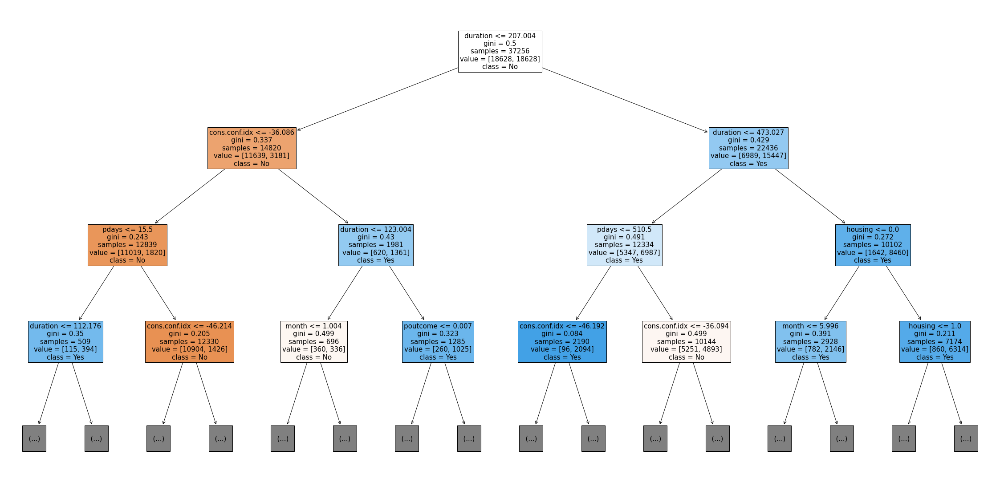

In [1106]:
fn=['age','job','marital','education', 'housing', 'month','duration', 'campaign', 'pdays', 'poutcome', 'cons.conf.idx']
cn=['No', 'Yes']
fig, ax = plt.subplots(figsize=(40, 20))
tree.plot_tree(decision_tree=clf,feature_names = fn, 
               class_names=cn,
               filled = True, max_depth= 3,fontsize=15);

Blue signifies a successful campaign, while orange represents an unsuccessful one.

Another Partial Graph to show more stopping points

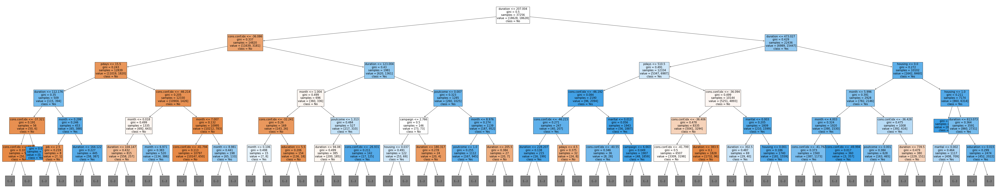

In [1107]:
fn=['age','job','marital','education', 'housing', 'month','duration', 'campaign', 'pdays', 'poutcome', 'cons.conf.idx']
cn=['No', 'Yes']
fig, ax = plt.subplots(figsize=(100, 20))
tree.plot_tree(decision_tree=clf,feature_names = fn, 
               class_names=cn,
               filled = True, max_depth= 5,fontsize=15);

Full Graph - Too deep to properly read

In [1108]:
fn=['age','job','marital','education', 'housing', 'month','duration', 'campaign', 'pdays', 'poutcome', 'cons.conf.idx']
cn=['Yes', 'No']
fig, ax = plt.subplots(figsize=(150, 150))
tree.plot_tree(decision_tree=clf,feature_names = fn, 
               class_names=cn,
               filled = True,fontsize=15);